Using device: cpu
=== Tailored Image Denoising System ===
Loading agricultural images...
Loaded 16 agricultural images
Loading aerial images...
Loaded 15 aerial images

=== Training Deep Learning Models ===
Training model for agricultural images...
Training on 16 images...
  Epoch [1/15], Loss: 0.167605
  Epoch [6/15], Loss: 0.009088
  Epoch [11/15], Loss: 0.009088
Training model for aerial images...
Training on 15 images...
  Epoch [1/15], Loss: 0.193336
  Epoch [6/15], Loss: 0.008428
  Epoch [11/15], Loss: 0.008591

=== Evaluating Agricultural Images ===

--- Testing gaussian noise ---
  Bilateral: PSNR=25.52dB, SSIM=0.7655
  Gaussian: PSNR=21.62dB, SSIM=0.4884
  Median: PSNR=20.65dB, SSIM=0.3651
  Deep Learning: PSNR=20.25dB, SSIM=0.5999


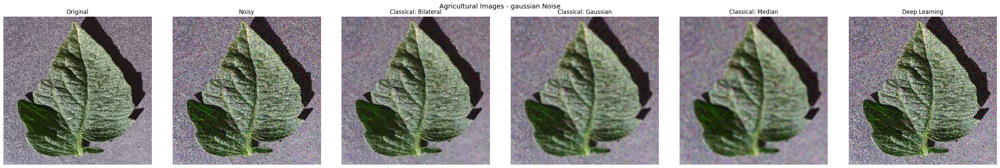


--- Testing salt_pepper noise ---
  Median: PSNR=21.03dB, SSIM=0.4089
  Morphological: PSNR=20.66dB, SSIM=0.5214
  Bilateral: PSNR=15.90dB, SSIM=0.3598
  Deep Learning: PSNR=15.93dB, SSIM=0.4420


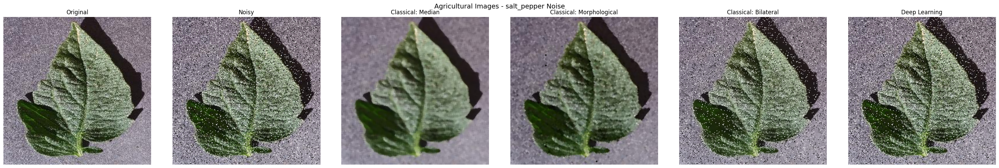


--- Testing poisson noise ---
  Bilateral: PSNR=27.85dB, SSIM=0.8228
  Gaussian: PSNR=22.12dB, SSIM=0.5376
  Median: PSNR=21.03dB, SSIM=0.4052
  Deep Learning: PSNR=27.92dB, SSIM=0.8781


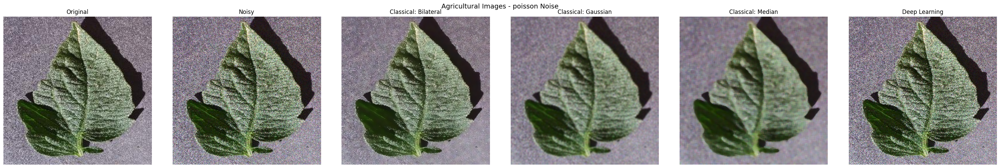


=== Evaluating Aerial Images ===

--- Testing gaussian noise ---
  Bilateral: PSNR=26.68dB, SSIM=0.7315
  Gaussian: PSNR=25.52dB, SSIM=0.6887
  Median: PSNR=23.87dB, SSIM=0.5525
  Deep Learning: PSNR=20.08dB, SSIM=0.4781


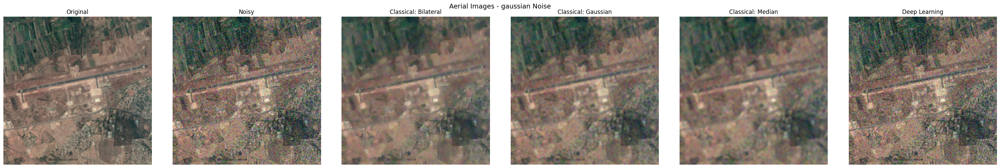


--- Testing salt_pepper noise ---
  Median: PSNR=24.79dB, SSIM=0.6401
  Morphological: PSNR=25.33dB, SSIM=0.7480
  Bilateral: PSNR=16.14dB, SSIM=0.2653
  Deep Learning: PSNR=16.16dB, SSIM=0.3385


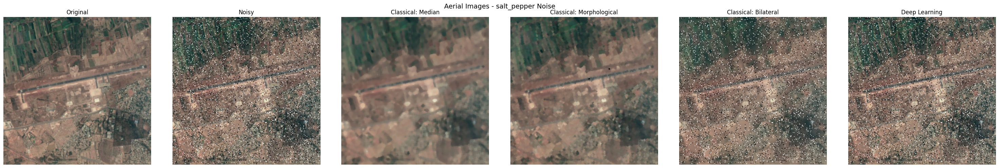


--- Testing poisson noise ---
  Bilateral: PSNR=29.15dB, SSIM=0.8136
  Morphological: PSNR=25.23dB, SSIM=0.7285
  Median: PSNR=24.69dB, SSIM=0.6210
  Deep Learning: PSNR=28.10dB, SSIM=0.8185


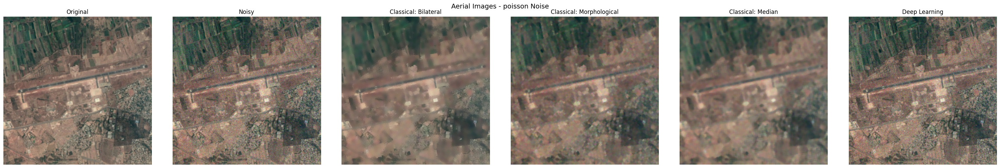


=== RESULTS SUMMARY ===

Agricultural Images:
  gaussian:
    Bilateral: PSNR=25.52dB, SSIM=0.7655
    Gaussian: PSNR=21.62dB, SSIM=0.4884
    Median: PSNR=20.65dB, SSIM=0.3651
    Deep_Learning: PSNR=20.25dB, SSIM=0.5999
  salt_pepper:
    Median: PSNR=21.03dB, SSIM=0.4089
    Morphological: PSNR=20.66dB, SSIM=0.5214
    Bilateral: PSNR=15.90dB, SSIM=0.3598
    Deep_Learning: PSNR=15.93dB, SSIM=0.4420
  poisson:
    Bilateral: PSNR=27.85dB, SSIM=0.8228
    Gaussian: PSNR=22.12dB, SSIM=0.5376
    Median: PSNR=21.03dB, SSIM=0.4052
    Deep_Learning: PSNR=27.92dB, SSIM=0.8781

Aerial Images:
  gaussian:
    Bilateral: PSNR=26.68dB, SSIM=0.7315
    Gaussian: PSNR=25.52dB, SSIM=0.6887
    Median: PSNR=23.87dB, SSIM=0.5525
    Deep_Learning: PSNR=20.08dB, SSIM=0.4781
  salt_pepper:
    Median: PSNR=24.79dB, SSIM=0.6401
    Morphological: PSNR=25.33dB, SSIM=0.7480
    Bilateral: PSNR=16.14dB, SSIM=0.2653
    Deep_Learning: PSNR=16.16dB, SSIM=0.3385
  poisson:
    Bilateral: PSNR=29.15dB, SS

In [3]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')

# PyTorch imports
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F

# Set random seeds for reproducibility
np.random.seed(42)
torch.manual_seed(42)
if torch.cuda.is_available():
    torch.cuda.manual_seed(42)

# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# ================================
# SECTION 1: DATA LOADING AND PREPROCESSING
# ================================

class ImageDataLoader:
    def __init__(self, agricultural_dir='Q2/Agricultural', aerial_dir='Q2/RS'):
        self.agricultural_dir = agricultural_dir
        self.aerial_dir = aerial_dir
        self.agricultural_images = []
        self.aerial_images = []
        
    def load_images_from_folder(self, folder, target_size=(256, 256)):
        """Load and preprocess images from a folder."""
        images = []
        if not os.path.exists(folder):
            print(f"Warning: Directory {folder} does not exist!")
            return images
        for filename in os.listdir(folder):
            if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.tiff', '.bmp')):
                img_path = os.path.join(folder, filename)
                img = cv2.imread(img_path)
                if img is not None:
                    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                    img = cv2.resize(img, target_size, interpolation=cv2.INTER_AREA)
                    img_normalized = img.astype(np.float32) / 255.0
                    images.append(img_normalized)
        return images
    
    def load_all_images(self):
        """Load agricultural and aerial images."""
        print("Loading agricultural images...")
        self.agricultural_images = self.load_images_from_folder(self.agricultural_dir)
        print(f"Loaded {len(self.agricultural_images)} agricultural images")
        
        print("Loading aerial images...")
        self.aerial_images = self.load_images_from_folder(self.aerial_dir)
        print(f"Loaded {len(self.aerial_images)} aerial images")
        
        return self.agricultural_images, self.aerial_images

# ================================
# SECTION 2: NOISE SIMULATION
# ================================

class NoiseGenerator:
    @staticmethod
    def add_gaussian_noise(image, mean=0, var=0.01):
        """Add Gaussian noise."""
        sigma = var**0.5
        gaussian = np.random.normal(mean, sigma, image.shape)
        noisy_image = image + gaussian
        return np.clip(noisy_image, 0, 1)

    @staticmethod
    def add_salt_pepper_noise(image, amount=0.05, s_vs_p=0.5):
        """Add salt and pepper noise."""
        noisy_image = np.copy(image)
        num_salt = np.ceil(amount * image.size * s_vs_p).astype(int)
        num_pepper = np.ceil(amount * image.size * (1 - s_vs_p)).astype(int)
        coords = [np.random.randint(0, i - 1, num_salt) for i in image.shape[:2]]
        noisy_image[coords[0], coords[1]] = 1
        coords = [np.random.randint(0, i - 1, num_pepper) for i in image.shape[:2]]
        noisy_image[coords[0], coords[1]] = 0
        return noisy_image

    @staticmethod
    def add_poisson_noise(image):
        """Add Poisson noise."""
        img_scaled = (image * 255).astype(np.uint8)
        noisy_scaled = np.random.poisson(img_scaled).astype(np.float32)
        return np.clip(noisy_scaled / 255.0, 0, 1)

# ================================
# SECTION 3: CLASSICAL DENOISING METHODS
# ================================

class ClassicalDenoiser:
    @staticmethod
    def median_filter(image, kernel_size=5):
        """Apply median filtering."""
        img_uint8 = (image * 255).astype(np.uint8)
        if kernel_size % 2 == 0:
            kernel_size += 1
        denoised = cv2.medianBlur(img_uint8, kernel_size)
        return denoised.astype(np.float32) / 255.0
    
    @staticmethod
    def bilateral_filter(image, d=9, sigmaColor=75, sigmaSpace=75):
        """Apply bilateral filtering."""
        img_uint8 = (image * 255).astype(np.uint8)
        denoised = cv2.bilateralFilter(img_uint8, d, sigmaColor, sigmaSpace)
        return denoised.astype(np.float32) / 255.0
    
    @staticmethod
    def morphological_filter(image, kernel_size=3):
        """Apply morphological filtering."""
        img_uint8 = (image * 255).astype(np.uint8)
        if kernel_size % 2 == 0:
            kernel_size += 1
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))
        opened = cv2.morphologyEx(img_uint8, cv2.MORPH_OPEN, kernel)
        denoised = cv2.morphologyEx(opened, cv2.MORPH_CLOSE, kernel)
        return denoised.astype(np.float32) / 255.0
    
    @staticmethod
    def gaussian_filter(image, kernel_size=5, sigma=0):
        """Apply Gaussian filtering."""
        img_uint8 = (image * 255).astype(np.uint8)
        if kernel_size % 2 == 0:
            kernel_size += 1
        denoised = cv2.GaussianBlur(img_uint8, (kernel_size, kernel_size), sigma)
        return denoised.astype(np.float32) / 255.0

# ================================
# SECTION 4: DEEP LEARNING MODELS
# ================================

class DenoisingCNN(nn.Module):
    """CNN for image denoising."""
    def __init__(self, in_channels=3, out_channels=3):
        super(DenoisingCNN, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(in_channels, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2, 2),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2, 2),
        )
        self.bottleneck = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
        )
        self.decoder = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True),
            nn.Conv2d(256, 128, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True),
            nn.Conv2d(128, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, out_channels, kernel_size=3, padding=1),
            nn.Sigmoid()
        )
        
    def forward(self, x):
        identity = x
        encoded = self.encoder(x)
        bottleneck = self.bottleneck(encoded)
        decoded = self.decoder(bottleneck)
        output = decoded + identity
        return torch.clamp(output, 0, 1)

class DenoisingDataset(Dataset):
    """Dataset for training denoising models."""
    def __init__(self, clean_images, noisy_images):
        self.clean_images = clean_images
        self.noisy_images = noisy_images
        
    def __len__(self):
        return len(self.clean_images)
    
    def __getitem__(self, idx):
        clean = torch.FloatTensor(self.clean_images[idx]).permute(2, 0, 1)
        noisy = torch.FloatTensor(self.noisy_images[idx]).permute(2, 0, 1)
        return noisy, clean

class DeepLearningDenoiser:
    def __init__(self, device=device):
        self.device = device
        self.model = None
        
    def prepare_training_data(self, clean_images, noise_generator):
        """Prepare training data with various noise types."""
        training_clean = []
        training_noisy = []
        for img in clean_images:
            training_clean.append(img)
            noise_type = np.random.choice(['gaussian', 'salt_pepper', 'poisson'], p=[0.4, 0.3, 0.3])
            if noise_type == 'gaussian':
                noisy_img = noise_generator.add_gaussian_noise(img, var=np.random.uniform(0.005, 0.02))
            elif noise_type == 'salt_pepper':
                noisy_img = noise_generator.add_salt_pepper_noise(img, amount=np.random.uniform(0.01, 0.05))
            else:
                noisy_img = noise_generator.add_poisson_noise(img)
            training_noisy.append(noisy_img)
        return training_clean, training_noisy
    
    def train_model(self, clean_images, noise_generator, epochs=15, lr=0.001, batch_size=4):
        """Train the denoising model."""
        if not clean_images:
            print("No training images provided!")
            return
        print(f"Training on {len(clean_images)} images...")
        train_clean, train_noisy = self.prepare_training_data(clean_images, noise_generator)
        dataset = DenoisingDataset(train_clean, train_noisy)
        dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
        self.model = DenoisingCNN().to(self.device)
        criterion = nn.MSELoss()
        optimizer = optim.Adam(self.model.parameters(), lr=lr)
        self.model.train()
        for epoch in range(epochs):
            epoch_loss = 0.0
            batch_count = 0
            for noisy, clean in dataloader:
                noisy, clean = noisy.to(self.device), clean.to(self.device)
                optimizer.zero_grad()
                outputs = self.model(noisy)
                loss = criterion(outputs, clean)
                loss.backward()
                optimizer.step()
                epoch_loss += loss.item()
                batch_count += 1
            if batch_count > 0 and epoch % 5 == 0:
                print(f"  Epoch [{epoch+1}/{epochs}], Loss: {epoch_loss/batch_count:.6f}")
    
    def denoise_image(self, noisy_image):
        """Denoise a single image."""
        if self.model is None:
            raise ValueError("Model not trained yet!")
        self.model.eval()
        with torch.no_grad():
            noisy_tensor = torch.FloatTensor(noisy_image).permute(2, 0, 1).unsqueeze(0).to(self.device)
            denoised_tensor = self.model(noisy_tensor)
            denoised_image = denoised_tensor.squeeze(0).permute(1, 2, 0).cpu().numpy()
        return np.clip(denoised_image, 0, 1)

# ================================
# SECTION 5: EVALUATION METRICS
# ================================

class Evaluator:
    @staticmethod
    def calculate_metrics(original, denoised):
        """Calculate PSNR and SSIM."""
        psnr_val = psnr(original, denoised, data_range=1.0)
        ssim_val = ssim(original, denoised, data_range=1.0, channel_axis=-1)
        return psnr_val, ssim_val
    
    @staticmethod
    def show_comparison(original, noisy, classical_results, dl_result, title):
        """Display comparison of original, noisy, classical, and deep learning results."""
        num_methods = 2 + len(classical_results) + (1 if dl_result is not None else 0)
        fig, axes = plt.subplots(1, num_methods, figsize=(5*num_methods, 5))
        axes = [axes] if num_methods == 1 else axes
        axes[0].imshow(original)
        axes[0].set_title("Original")
        axes[0].axis('off')
        axes[1].imshow(noisy)
        axes[1].set_title("Noisy")
        axes[1].axis('off')
        for i, (method_name, result) in enumerate(classical_results.items()):
            axes[i+2].imshow(result)
            axes[i+2].set_title(f"Classical: {method_name}")
            axes[i+2].axis('off')
        if dl_result is not None:
            axes[-1].imshow(dl_result)
            axes[-1].set_title("Deep Learning")
            axes[-1].axis('off')
        fig.suptitle(title, fontsize=14)
        plt.tight_layout()
        plt.show()

# ================================
# SECTION 6: MAIN EXECUTION
# ================================

def main():
    """Main function to execute tailored denoising."""
    print("=== Tailored Image Denoising System ===")
    
    # Load images
    data_loader = ImageDataLoader()
    agricultural_images, aerial_images = data_loader.load_all_images()
    if not agricultural_images and not aerial_images:
        print("No images found! Check directory paths.")
        return
    
    # Initialize components
    noise_gen = NoiseGenerator()
    classical_denoiser = ClassicalDenoiser()
    dl_denoiser_agri = DeepLearningDenoiser()
    dl_denoiser_aerial = DeepLearningDenoiser()
    evaluator = Evaluator()
    
    # Train deep learning models
    print("\n=== Training Deep Learning Models ===")
    if agricultural_images:
        print("Training model for agricultural images...")
        dl_denoiser_agri.train_model(agricultural_images, noise_gen)
    if aerial_images:
        print("Training model for aerial images...")
        dl_denoiser_aerial.train_model(aerial_images, noise_gen)
    
    # Define noise types
    noise_types = {
        'gaussian': lambda img: noise_gen.add_gaussian_noise(img, var=0.01),
        'salt_pepper': lambda img: noise_gen.add_salt_pepper_noise(img, amount=0.03),
        'poisson': lambda img: noise_gen.add_poisson_noise(img)
    }
    
    # Define tailored classical methods for each image type and noise type
    method_map = {
        'Agricultural': {
            'gaussian': [
                ('Bilateral', classical_denoiser.bilateral_filter),
                ('Gaussian', classical_denoiser.gaussian_filter),
                ('Median', classical_denoiser.median_filter)
            ],
            'salt_pepper': [
                ('Median', classical_denoiser.median_filter),
                ('Morphological', classical_denoiser.morphological_filter),
                ('Bilateral', classical_denoiser.bilateral_filter)
            ],
            'poisson': [
                ('Bilateral', classical_denoiser.bilateral_filter),
                ('Gaussian', classical_denoiser.gaussian_filter),
                ('Median', classical_denoiser.median_filter)
            ]
        },
        'Aerial': {
            'gaussian': [
                ('Bilateral', classical_denoiser.bilateral_filter),
                ('Gaussian', classical_denoiser.gaussian_filter),
                ('Median', classical_denoiser.median_filter)
            ],
            'salt_pepper': [
                ('Median', classical_denoiser.median_filter),
                ('Morphological', classical_denoiser.morphological_filter),
                ('Bilateral', classical_denoiser.bilateral_filter)
            ],
            'poisson': [
                ('Bilateral', classical_denoiser.bilateral_filter),
                ('Morphological', classical_denoiser.morphological_filter),
                ('Median', classical_denoiser.median_filter)
            ]
        }
    }
    
    # Evaluate methods
    results = {}
    for dataset_name, images in [('Agricultural', agricultural_images), ('Aerial', aerial_images)]:
        if not images:
            continue
        print(f"\n=== Evaluating {dataset_name} Images ===")
        results[dataset_name] = {}
        dl_denoiser = dl_denoiser_agri if dataset_name == 'Agricultural' else dl_denoiser_aerial
        
        test_images = images[:min(3, len(images))]
        for noise_name, noise_func in noise_types.items():
            print(f"\n--- Testing {noise_name} noise ---")
            results[dataset_name][noise_name] = {}
            noisy_images = [noise_func(img) for img in test_images]
            
            # Apply tailored classical methods
            classical_methods = method_map[dataset_name][noise_name]
            classical_results = {}
            for method_name, method_func in classical_methods:
                psnr_scores = []
                ssim_scores = []
                method_results = []
                for original, noisy in zip(test_images, noisy_images):
                    denoised = method_func(noisy)
                    method_results.append(denoised)
                    p, s = evaluator.calculate_metrics(original, denoised)
                    psnr_scores.append(p)
                    ssim_scores.append(s)
                avg_psnr = np.mean(psnr_scores)
                avg_ssim = np.mean(ssim_scores)
                results[dataset_name][noise_name][method_name] = {'psnr': avg_psnr, 'ssim': avg_ssim}
                classical_results[method_name] = method_results[0]
                print(f"  {method_name}: PSNR={avg_psnr:.2f}dB, SSIM={avg_ssim:.4f}")
            
            # Deep learning denoising
            dl_result = None
            if dl_denoiser.model is not None:
                dl_psnr_scores = []
                dl_ssim_scores = []
                dl_results = []
                for original, noisy in zip(test_images, noisy_images):
                    try:
                        denoised_dl = dl_denoiser.denoise_image(noisy)
                        dl_results.append(denoised_dl)
                        p, s = evaluator.calculate_metrics(original, denoised_dl)
                        dl_psnr_scores.append(p)
                        dl_ssim_scores.append(s)
                    except Exception as e:
                        print(f"  Deep Learning error: {e}")
                        continue
                if dl_results:
                    avg_dl_psnr = np.mean(dl_psnr_scores)
                    avg_dl_ssim = np.mean(dl_ssim_scores)
                    results[dataset_name][noise_name]['Deep_Learning'] = {'psnr': avg_dl_psnr, 'ssim': avg_dl_ssim}
                    dl_result = dl_results[0]
                    print(f"  Deep Learning: PSNR={avg_dl_psnr:.2f}dB, SSIM={avg_dl_ssim:.4f}")
            
            # Show comparison
            evaluator.show_comparison(
                test_images[0], noisy_images[0], classical_results, dl_result,
                f"{dataset_name} Images - {noise_name} Noise"
            )
    
    # Print summary
    print("\n=== RESULTS SUMMARY ===")
    for dataset_name, dataset_results in results.items():
        print(f"\n{dataset_name} Images:")
        for noise_name, noise_results in dataset_results.items():
            print(f"  {noise_name}:")
            for method_name, metrics in noise_results.items():
                print(f"    {method_name}: PSNR={metrics['psnr']:.2f}dB, SSIM={metrics['ssim']:.4f}")

if __name__ == "__main__":
    main()